<a href="https://colab.research.google.com/github/SummerPapaya/ATC-BI-System/blob/main/CIS9655_Data_Visualization_Team_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Overview of the Global Education Status - Xia Li

Datasource: World Bank https://api.worldbank.org/v2/en/topic/4?downloadformat=csv

## Read the Education Dataset

*Data preprocessing was done in a seperate file

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%pip install pyviz panel
%pip install hvplot

In [5]:
import pandas as pd
import numpy as np

import panel as pn
from panel.interact import interact
pn.extension()

import hvplot.pandas

import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.figure import Figure
import param

import plotly.graph_objects as go


In [6]:
#Write to CSV for Tableau use
df_merged = pd.read_csv("/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/ XL Datasets/Education_Merged.csv")

In [7]:
# Fill NAs with 0s
df_filledNA = df_merged.fillna(0)


## A Glance At Global Educational Status

#### Educational indicators over time by region

In [8]:
region_agg = df_merged.loc[df_merged['Region'].isnull()]


In [9]:
import plotly.graph_objs as go

# Initialize figure
fig = go.Figure()

# Add Traces

df_world = df_merged[df_merged['Country Code']=='WLD']

fig.add_trace(
    go.Scatter(x=list(df_world.Year),
               y=list(df_world['School enrollment, primary (% gross)']),
               name="Primary",
               line=dict(color="#33CFA5")))

fig.add_trace(
    go.Scatter(x=list(df_world.Year),
               y=[df_world['School enrollment, primary (% gross)'].mean()] * len(df_merged.index),
               name="Primary Average",
               visible=False,
               line=dict(color="#33CFA5", dash="dash")))

fig.add_trace(
    go.Scatter(x=list(df_world.Year),
               y=list(df_world['School enrollment, secondary (% gross)']),
               name="Secondary",
               line=dict(color="#F06A6A")))

fig.add_trace(
    go.Scatter(x=list(df_world.Year),
               y=[df_world['School enrollment, secondary (% gross)'].mean()] * len(df_merged.index),
               name="Secondary Average",
               visible=False,
               line=dict(color="#F06A6A", dash="dash")))

fig.add_trace(
    go.Scatter(x=list(df_world.Year),
               y=list(df_world['School enrollment, tertiary (% gross)']),
               name="Tertiary",
               line=dict(color="#FFA500")))

fig.add_trace(
    go.Scatter(x=list(df_world.Year),
               y=[df_world['School enrollment, tertiary (% gross)'].mean()] * len(df_merged.index),
               name="Tertiary Average",
               visible=False,
               line=dict(color="#FFA500", dash="dash")))

fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="None",
                     method="update",
                     args=[{"visible": [True, False, True, False, True, False]},
                           {"title": "School Enrollment Rate",
                            "annotations": []}]),
                dict(label="Primary",
                     method="update",
                     args=[{"visible": [True, True, False, False, False, False]},
                           {"title": "School Enrollment Rate - Primary",
                            "annotations": []}]),
                dict(label="Secondary",
                     method="update",
                     args=[{"visible": [False, False, True, True, False, False]},
                           {"title": "School Enrollment Rate - Secondary",
                            "annotations": []}]),
                 dict(label="Tertiary",
                     method="update",
                     args=[{"visible": [False, False, False, False, True, True]},
                           {"title": "School Enrollment Rate - Tertiary",
                            "annotations": []}]),
                dict(label="All",
                     method="update",
                     args=[{"visible": [True, True, True, True, True, True]},
                           {"title": "School Enrollment Rate - Primary, Secondary and Tertiary",
                            "annotations": []}]),
            ]),
        )
    ])

# Set title
fig.update_layout(title_text="School Enrollment Rate")

fig.show()

In [42]:
import plotly.express as px

literacy = df_merged[['IncomeGroup', 'Literacy rate, adult total (% of people ages 15 and above)']]
income_order = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']
fig = px.bar(literacy.groupby(['IncomeGroup']).mean().reset_index(),
             x="IncomeGroup", y="Literacy rate, adult total (% of people ages 15 and above)",
             title='Distribution of Literacy Rate by IncomeGroup',
            category_orders={"IncomeGroup": income_order})


fig.show()

In [44]:
fig = px.histogram(df_merged, x="Literacy rate, adult total (% of people ages 15 and above)", color="IncomeGroup", marginal="rug",
                   hover_data=df_merged.columns, opacity=0.7,
                   title='Distribution of Literacy Rate (% of 15+ people) by Income Group',
                  )
fig.show()

In [46]:
fig = px.histogram(df_merged, x="Literacy rate, adult total (% of people ages 15 and above)", color="IncomeGroup", marginal="rug",
                   hover_data=df_merged.columns, opacity=0.7,
                  animation_frame="Year",
                   title='Distribution of Literacy Rate (% of 15+ people) by Income Group Over the Years',
                   log_x=False, range_x=[1,100], range_y=[0,15],
                  category_orders={'Year':[1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]})

fig.show()

In [47]:


school_att = df_merged[['Region', "Educational attainment, at least Master's or equivalent, population 25+, total (%) (cumulative)",
               'Educational attainment, Doctoral or equivalent, population 25+, total (%) (cumulative)',
              "Educational attainment, at least Bachelor's or equivalent, population 25+, total (%) (cumulative)"]].groupby(['Region']).mean().reset_index()

fig = go.Figure(data=[
    go.Bar(name="Bachelor", x=school_att['Region'], y=school_att["Educational attainment, at least Bachelor's or equivalent, population 25+, total (%) (cumulative)"]),
    go.Bar(name="Master's", x=school_att['Region'], y=school_att["Educational attainment, at least Master's or equivalent, population 25+, total (%) (cumulative)"]),
    go.Bar(name="Doctoral's", x=school_att['Region'], y=school_att['Educational attainment, Doctoral or equivalent, population 25+, total (%) (cumulative)'])

])
    # Change the bar mode
fig.update_layout(barmode='group', xaxis={'categoryorder':'total descending'},
                  title='Educational Attainment, Bachelor Above by Income Group and Region')
fig.show()

In [48]:
school_erm = df_merged[['Region', 'School enrollment, primary (% gross)',
                        'School enrollment, secondary (% gross)',
                       'School enrollment, tertiary (% gross)']].groupby(['Region']).mean().reset_index()

fig = go.Figure(data=[
    go.Bar(name='Primary', x=school_erm['Region'], y=school_erm['School enrollment, primary (% gross)']),
    go.Bar(name='Secondary', x=school_erm['Region'], y=school_erm['School enrollment, secondary (% gross)']),
    go.Bar(name='Tertiary', x=school_erm['Region'], y=school_erm['School enrollment, tertiary (% gross)'])
])
# Change the bar mode
fig.update_layout(barmode='group', xaxis={'categoryorder':'total descending'},
                  title='Distribution of Literacy Rate (% of 15+ people) Over the Years')
fig.show()

##### Bubble Chart Setup

In [17]:
import plotly.graph_objects as go
from ipywidgets import widgets

Year = widgets.IntSlider(
    value=1.0,
    min=1970,
    max=2022,
    step=1.0,
    description='Year:',
    continuous_update=False
)


container = widgets.HBox(children=[Year])

textbox = widgets.Dropdown(
    description='Region:  ',
    value='North America',
    options=df_merged['Region'].unique().tolist()
)

IncomeGroup = widgets.Dropdown(
    options=list(df_merged['IncomeGroup'].unique()),
    value='Low income',
    description='Income Group: ',
)


# Assign an empty figure widget with two traces
trace1 = go.Histogram(x=df_merged['School enrollment, primary (% gross)'], opacity=0.75, name='Primary')
trace2 = go.Histogram(x=df_merged['School enrollment, secondary (% gross)'], opacity=0.75, name='Secondary')
trace3 = go.Histogram(x=df_merged['School enrollment, tertiary (% gross)'], opacity=0.75, name='Tertiary')
g = go.FigureWidget(data=[trace1, trace2, trace3],
                    layout=go.Layout(
                        title=dict(
                            text='NYC FlightDatabase'
                        ),
                        barmode='overlay'
                    ))

In [18]:
def validate():
    if IncomeGroup.value in df_merged['IncomeGroup'].unique() and textbox.value in df_merged['Country Name'].unique():
        return True
    else:
        return False


def response(change):
    if validate():
        if Year.value:
            filter_list = [i and j and k for i, j, k in
                           zip(df_merged['Year'] == Year.value, textbox.value in df_merged['Region'],
                               df_merged['IncomeGroup'] == IncomeGroup.value)]
            temp_df = df_merged[filter_list]

        else:
            filter_list = [i and j for i, j in
                           zip(df_merged['Region'] == 'DL', df_merged['IncomeGroup'] == IncomeGroup.value)]
            temp_df = df_merged[filter_list]
        x1 = temp_df['School enrollment, primary (% gross)']
        x2 = temp_df['School enrollment, secondary (% gross)']
        x3 = temp_df['School enrollment, tertiary (% gross)']
        with g.batch_update():
            g.data[0].x = x1
            g.data[1].x = x2
            g.data[2].x = x3
            g.layout.barmode = 'overlay'
            g.layout.xaxis.title = 'School Enrollment Rate'
            g.layout.yaxis.title = 'Number of Countries'


IncomeGroup.observe(response, names="value")
textbox.observe(response, names="value")
Year.observe(response, names="value")



container2 = widgets.HBox([IncomeGroup, textbox])
widgets.VBox([container,
              container2,
              g])



##### Bubble Charts

In [49]:
# bubble size - GDP
# Fill in the N/A makes this visual look messy, so here we just dropped the N/A values for gdpMillion to avoid the error and see the overall trend

df_bubble = region_agg[region_agg['gdpMillion'].notnull()]
df_bubble.sort_values('Year', ascending=True)

fig = px.scatter(df_bubble, x="Government expenditure on education, total (% of GDP)", y="Literacy rate, adult total (% of people ages 15 and above)", animation_frame="Year", animation_group="Country Name",
                size="gdpMillion", color="Country Name", hover_name="Country Name",
                 width=1200, height=800,
                log_x=False, size_max=45, range_x=[1,10], range_y=[0,100],
                 title='Government Expenditure on Education (% of GDP)',
                category_orders={'Year':[1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]})
fig.show()

In [51]:
# bubble size - population
# Fill in the N/A makes this visual look messy, so here we just dropped the N/A values for gdpMillion to avoid the error and see the overall trend

df_bubble2 = region_agg[region_agg['Population'].notnull()]
df_bubble2.sort_values('Year', ascending=True)

fig = px.scatter(df_bubble2, x="School enrollment, primary (% gross)", y="Literacy rate, adult total (% of people ages 15 and above)", animation_frame="Year", animation_group="Country Name",
                size="Population", color="Country Name", hover_name="Country Name",
                 width=1200, height=800,
                log_x=False, size_max=45, range_x=[1,120], range_y=[0,100],
                 title='School Enrollment Rate vs Literacy Rate (% of 15+ People)',
                category_orders={'Year':[1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]})
fig.show()

#Investment in Education - Hiroko Gion
Correlation between Education Expenditure per Student and PISA Average Score PISA Average Score and Education Expenditure per full-time student

In [22]:
import numpy as np
import pandas as pd
import plotly.express as px

PISA_Expenditure = pd.read_excel("/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/HG datasets/PISA Score and Expenditure per Student.xlsx")

# Convert columns to float
PISA_Expenditure['Expenditure ($)'] = PISA_Expenditure['Expenditure ($)'].astype(float)
PISA_Expenditure['Average Score'] = PISA_Expenditure['Average Score'].astype(float)

# Calculate the trendline
m, b = np.polyfit(PISA_Expenditure['Expenditure ($)'], PISA_Expenditure['Average Score'], 1)
trendline_y = m * PISA_Expenditure['Expenditure ($)'] + b

# Color scale
color_scale = px.colors.sequential.Viridis

# Create the scatter plot
fig = px.scatter(PISA_Expenditure, x='Expenditure ($)', y='Average Score', color='Average Score',
                 color_continuous_scale=color_scale,
                 labels={'Expenditure ($)': 'Education Expenditure per Student ($)',
                         'Average Score': 'PISA Mathematics Average Score'},
                 title='Correlation between Education Expenditure per Student and PISA Average Score (Mathematics)',
                 hover_data={'Country Name': True, 'Expenditure ($)': ':.2f', 'Average Score': ':.2f'},
                 opacity=0.7,
                )

# Add trend line
fig.add_scatter(x=PISA_Expenditure['Expenditure ($)'], y=trendline_y, mode='lines', name='Trendline',
                line=dict(color='black', width=2, dash='dash'))

#layout
fig.update_layout(
    xaxis=dict(title='Education Expenditure per Student($) (2020)<br>' + '(Primary to post-secondary education)'),
    yaxis=dict(title='PISA Mathematics Average Score (2022)'),
    hovermode='closest',
    showlegend=True,
    autosize=True,
    height=700,
    width=1200
)

fig.update_traces(name='PISA Mathematics Average Score', selector=dict(type='scatter'), showlegend=False)

# Update scatter marker size
fig.update_traces(marker=dict(size=10))

# Sort DataFrame by average score
PISA_Expenditure_sorted = PISA_Expenditure.sort_values(by='Average Score')

# Select top 5 highest and bottom 5 lowest countries
top_5_highest = PISA_Expenditure_sorted[-5:]
top_5_lowest = PISA_Expenditure_sorted[:5]

# Add labels for top 5 highest countries
for i, row in top_5_highest.iterrows():
    fig.add_annotation(x=row['Expenditure ($)'], y=row['Average Score'],
                       text=row['Country Name'], showarrow=False, font=dict(color='black'),
                       xshift=40, yshift=2)

# Add labels for bottom 5 lowest countries
for i, row in top_5_lowest.iterrows():
    fig.add_annotation(x=row['Expenditure ($)'], y=row['Average Score'],
                       text=row['Country Name'], showarrow=False, font=dict(color='black'),
                       xshift=10, yshift=-15)

# Add annotation for OECD average
fig.add_annotation(x=PISA_Expenditure.loc[PISA_Expenditure['Country Name'] == 'OECD', 'Expenditure ($)'].values[0],
                   y=PISA_Expenditure.loc[PISA_Expenditure['Country Name'] == 'OECD', 'Average Score'].values[0],
                   text='OECD Average', showarrow=True, arrowhead=2, arrowcolor='black',
                   arrowwidth=2, ax=60, ay=80, font=dict(color='red'))

# Update hover template
fig.update_traces(hovertemplate='Country Name: %{customdata[0]}<br>' +
                                 'Expenditure per student: $%{customdata[1]:,.2f}<br>' +
                                 'PISA Average Score: %{customdata[2]:,.2f}<extra></extra>')

# Add custom data for hover
fig.update_traces(customdata=PISA_Expenditure[['Country Name', 'Expenditure ($)', 'Average Score']])

fig.show()



## Unemployment and Education - Jefferson Veliz

In [ ]:
pip install dash

In [24]:
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import pandas as pd
import plotly.express as px
import pandas as pd
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

<ipython-input-24-d2cb7f7ad6f5>:12: UserWarning:


The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

<ipython-input-24-d2cb7f7ad6f5>:13: UserWarning:


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`



In [25]:
JV1= pd.read_csv( "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/Jefferson's data /Unemployment (%), 15-24, Modeled.csv")
JV2= pd.read_csv( "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/Jefferson's data /Cleaned_Youth_NEET_Dataset.csv")
JV3= pd.read_csv( "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/Jefferson's data /long term unemployment.csv")
JV4= pd.read_csv( "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/Jefferson's data /15+.csv")
df1 =pd.read_excel ("/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/Jefferson's data /Unemployment rate by education level.xlsx")
JV5= pd.read_csv( "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/Jefferson's data /15+.csv")
JV6 = pd.read_csv("/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/Jefferson's data /Unemployment (%).csv")

In [26]:

# Creating the interactive plot
fig = px.line(JV1, x='Year', y=['World, Female', 'World, Male', 'World, Total'],
              labels={'value': 'Unemployment Rate (%)', 'variable': 'Category'},
              title='Global Unemployment Rates (Ages-15-24) Over Time')

# Show the figure
fig.show()









In [52]:

# Load your data
data = JV6

# List of OECD member countries
oecd_countries = [
    "Australia", "Austria", "Belgium", "Canada", "Chile", "Colombia",
    "Czech Republic", "Denmark", "Estonia", "Finland", "France", "Germany",
    "Greece", "Hungary", "Iceland", "Ireland", "Israel", "Italy", "Japan",
    "Korea", "Latvia", "Lithuania", "Luxembourg", "Mexico", "Netherlands",
    "New Zealand", "Norway", "Poland", "Portugal", "Slovak Republic",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Turkey", "United Kingdom",
    "United States", "Costa Rica"
]

# Filter the dataset for OECD member countries
data = data[data['Economy'].isin(oecd_countries)]

# Display the filtered data
#oecd_unemployment_data.head(), oecd_unemployment_data['Economy'].unique()

data = data




# Initialize the Dash app
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("Unemployment Rates Dashboard"),

    # Dropdown menu for selecting gender
    dcc.Dropdown(
        id='gender-dropdown',
        options=[
            {'label': 'Female', 'value': 'Unemployment, youth female (% of female labor force ages 15-24) (modeled ILO estimate)'},
            {'label': 'Male', 'value': 'Unemployment, youth male (% of male labor force ages 15-24) (modeled ILO estimate)'},
            {'label': 'Total', 'value': 'Unemployment, youth total (% of total labor force ages 15-24) (modeled ILO estimate)'}
        ],
        value='Unemployment, youth female (% of female labor force ages 15-24) (modeled ILO estimate)',  # Default value
        clearable=False,
        style={"width": "90%"}
    ),

    # Dropdown menu for selecting countries
    dcc.Dropdown(
        id='country-dropdown',
        options=[{'label': country, 'value': country} for country in data['Economy'].unique()],
        value=[data['Economy'].unique()[0]],  # Default to the first country
        multi=True,
        placeholder="Select countries",
        style={"width": "90%", "margin-bottom": "20px"}
    ),

    # Graph for displaying the unemployment data
    dcc.Graph(id='unemployment-graph'),
])

# Callback for updating the graph based on the dropdown selections
@app.callback(
    Output('unemployment-graph', 'figure'),
    [Input('gender-dropdown', 'value'), Input('country-dropdown', 'value')]
)
def update_graph(selected_gender, selected_countries):
    # Filter data based on selected countries
    filtered_data = data[data['Economy'].isin(selected_countries)] if selected_countries else data

    # Create the figure
    fig = px.bar(
        filtered_data,
        x='Economy',
        y=selected_gender,
        title='Youth Unemployment Rates, labor force ages 15-24'
    )

    # Update the layout for a cleaner look
    fig.update_layout(
        yaxis_title='Unemployment Rate (%)',
        margin=dict(l=60, r=60, t=50, b=150),
        yaxis=dict(title_standoff=10),
        xaxis_tickangle=-45
    )

    return fig

if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>

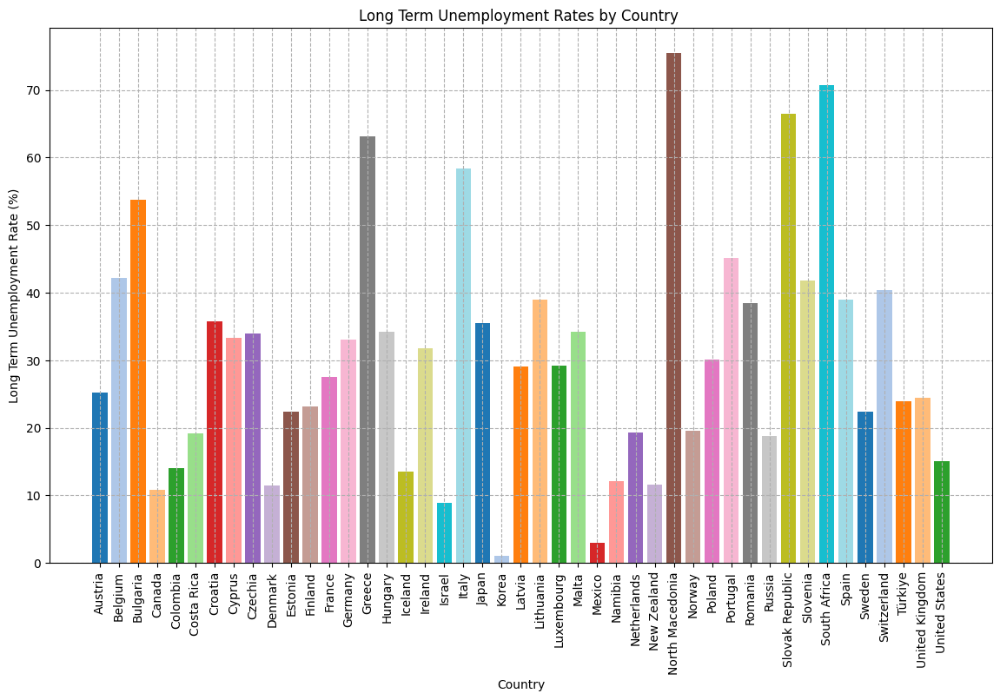

In [28]:

data_long_term = JV3

# Removing the corrected names from the dataset
rows_to_remove_corrected = ["G7", "OECD - Total", "European Union (27 countries)"]
filtered_data_corrected = data_long_term[~data_long_term['Country'].isin(rows_to_remove_corrected)]

# Create the updated bar chart
colors = plt.cm.tab20.colors  # Using tab20 colormap to provide distinct colors for each bar
plt.figure(figsize=(14, 8))
bars = plt.bar(filtered_data_corrected['Country'], filtered_data_corrected['Long Term unemployment(1 year)'], color=colors[:len(filtered_data_corrected)])
plt.xticks(rotation=90)
plt.title('Long Term Unemployment Rates by Country ')
plt.xlabel('Country')
plt.ylabel('Long Term Unemployment Rate (%)')
plt.grid(True, linestyle='--')
plt.show()


In [29]:
# Convert 'Year' to integer type, handling missing or non-integer values
df1['Year'] = pd.to_numeric(df1['Year'], errors='coerce').fillna(0).astype(int)
# Define the education levels to filter
education_levels = ["Post-secondary non-tertiary education", "Tertiary education"]

# Filter the DataFrame
filtered_df = df1[(df1['Education level'].isin(education_levels)) &
                 (df1['INDICATOR'] == 'Unemployment rate')]

filtered_df
# Remove leading and trailing whitespace from the 'Country Name' column
filtered_df['Country Name'] = filtered_df['Country Name'].str.strip()

# Calculate the total value for each country by summing the values for "Post-secondary non-tertiary education" and "Tertiary education"
filtered_df['Total'] = filtered_df.groupby('Country Name')['Value'].transform('sum')

# Sort the DataFrame by the total value in ascending order
filtered_df_sorted = filtered_df.sort_values(by='Total', ascending=False)

# Create an interactive vertical bar chart with hover-over interaction
fig = px.bar(filtered_df_sorted, x='Country Name', y='Value', color='Education level',
             custom_data=['Total', 'Education level'],  # Include the total value and education level as custom data
             title='Unemployment Rate by Education Level in OECD Countries (2022)',
             labels={'Value': 'Unemployment Rate (%)', 'Country Name': 'Country'},
             orientation='v', category_orders={"Education level": ["Post-secondary non-tertiary education", "Tertiary education"]})

# Define a custom hover template to format the hover data
hover_template = "<b>%{x}</b><br>" + \
                 "Education Level: %{customdata[1]}<br>" + \
                 "Unemployment Rate: %{y:.2f}%<br>" + \
                 "Total Unemployment Rate: %{customdata[0]:.2f}%<extra></extra>"
fig.update_traces(hovertemplate=hover_template)

# Update the layout to increase the height of the plot
fig.update_layout(xaxis_tickangle=-90, width=1200)

fig.show()

<ipython-input-29-d63225a0cfb8>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-29-d63225a0cfb8>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [30]:
data = JV2
# Convert wide format to long format for easier plotting with Plotly
data_long = data.melt(id_vars='Country', var_name='Group', value_name='Percentage')

# Create the interactive scatter plot
fig = px.scatter(data_long, x='Country', y='Percentage', color='Group',
                 hover_data=['Country', 'Percentage'], symbol='Group',
                 title='Youth not in employment, education or training (NEET)',
                 labels={"Country": "Country", "Percentage": "Percentage (%)"},
                 category_orders={"Group": ["Men 15-19", "Men 20-24", "Women 15-19", "Women 20-24"]})

# Enhance marker styles and sizes
fig.update_traces(marker=dict(size=10, line=dict(width=2, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

# Rotate the country names for better readability
fig.update_layout(xaxis_tickangle=-45)

# Show the figure
fig.show()

## Geder Disparity and Education - Berire Goncuoglu


In [31]:
import plotly.express as px
import pandas as pd

# Data
csv_file = "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/BR datasets/gender-ratios-for-mean-years-of-schooling.csv"
df = pd.read_csv(csv_file)

# Create animated bar chart
fig = px.bar(df,
             x='Gender Ratio',
             y='Region',
             animation_frame='Year',
             range_x=[0, 1.1],
             color='Region',
             labels={'Gender_Ratio': 'Gender Ratio (15-64 year olds)', 'Year': 'Year'},
             title='Average Years of Schooling Gender Ratio by Region')

# Add play and pause buttons
fig.update_layout(updatemenus=[dict(type='buttons', showactive=False,
                                    buttons=[dict(label='Play',
                                                  method='animate',
                                                  args=[None,
                                                        dict(frame=dict(duration=2000, redraw=True),
                                                             fromcurrent=True)])])])

# Show figure
fig.show()

# **LITERACY RATE**

In [32]:
import pandas as pd
import plotly.express as px

df = pd.read_csv("/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/BR datasets/literacy rate by gender and income level.csv")

# Filter the DataFrame to include only the years 2000, 2010, and 2021
df = df[['Gender', 'Income Level', '2000', '2010', '2021']]

# Melt the DataFrame to long format for easier plotting
df_long = df.melt(id_vars=['Gender', 'Income Level'], var_name='Year', value_name='Income')

# Define custom colors for each year
colors = px.colors.qualitative.Pastel1

# Arrange the order of genders
category_orders = {'Gender': ['Female', 'Male', 'Total']}

# Plot vertical grouped bar chart using Plotly Express
fig = px.bar(df_long,
             y='Income',  # Set y to 'Income' for vertical bars
             x='Income Level',  # Set x to 'Income Level' for vertical bars
             color='Year',
             facet_row='Gender',  # Use facet_row instead of facet_col for vertical bars
             facet_col='Year',    # Use facet_col for grouping by year
             color_discrete_sequence=colors,
             barmode='group', # Set barmode to 'group' for grouped bars
             text=None,
             text_auto=True,
             category_orders=category_orders) # Set category order for 'Gender'

fig.update_yaxes(showticklabels=False)
# Remove legend title
fig.update_layout(legend_title_text='')
fig.update_traces(showlegend=False)

# Remove x-axis title
fig.update_xaxes(title='')
fig.update_yaxes(title='')

# Add facet titles
fig.update_xaxes(row=3, col=2)

fig.show()


# **WOMEN IN LEADERSHIP ROLES**

In [33]:
import pandas as pd
import plotly.express as px

## Load the dataset from the CSV file
csv_file = "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/BR datasets/Leadership.csv"
df = pd.read_csv(csv_file)

# Filter data for the year 2022
df = df[df['Year'] == 2022]

# Filter out rows where the "Value" column is zero
df = df[df['Value'] != 0]

# Filter the dataset for the specified OECD countries
OECD_countries = [
    "Austria", "Australia", "Belgium", "Canada", "Chile", "Colombia", "Czech Republic", "Denmark", "Estonia", "Finland", "France", "Germany", "Hungary", "Iceland", "Ireland", "Israel", "Italy", "Japan", "Korea", "Latvia", "Lithuania", "Luxembourg", "Mexico", "Netherlands", "New Zealand", "Norway", "Poland", "Portugal", "Slovak Republic", "Slovenia", "Spain", "Sweden", "Switzerland", "Turkiye", "United Kingdom" , "United States"
]

filtered_df = df[df['Country Name'].isin(OECD_countries)]

# Filter the dataset for the specified fields related to women empowerment indicators
required_indicators = [
    'Female share of employment in senior and middle management (%)',
    'Firms with female top manager (% of firms)',
    'Proportion of seats held by women in national parliaments (%)',
    'Proportion of women in ministerial level positions (%)'
]

filtered_df = filtered_df[filtered_df['Indicator Name'].isin(required_indicators)]

# Plot the Treemap
fig = px.treemap(filtered_df,
                 path=['Country Name', 'Indicator Name'],
                 values='Value',
                 title='Proportion of seats held by Women in National Parliaments & Ministerial Level of Positions (%) in 2022'
                )

# Show the plot
fig.show()


In [34]:
import pandas as pd
from IPython.display import HTML

# Load the dataset from the CSV file
csv_file = "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/BR datasets/Firms with female top manager (% of firms).csv"
df = pd.read_csv(csv_file)

# Filter out rows where the "Value" column is zero
df = df[df['Value'] != 0]

# Filter the dataset for the required indicator (Firms with female top manager (% of firms))
indicator = 'Firms with female top manager (% of firms)'
filtered_df = df[df['Indicator Name'] == indicator]

# Format the text representation with bigger font for percentages
text_representation = "<div style='border: 1px solid black; padding: 10px;'>"
text_representation += "<h3>Firms with female top manager by income group (% of firms)</h3><br>"
for index, row in filtered_df.iterrows():
    text_representation += f"<p>{row['Income Level']}</p>"
    text_representation += f"<p style='font-size: 16px;'>{row['Value']:.1f}%</p><br>"

# Close the div tag
text_representation += "</div>"

# Display the HTML content
HTML(text_representation)


# **LABOR FORCE PARTICIPATION**

In [35]:
import pandas as pd
import plotly.express as px

# Load the dataset
csv_file = "/content/drive/MyDrive/Data Viz - Team 8/Python Data - For Presentation/BR datasets/labor force by gender OECD.csv"
df = pd.read_csv(csv_file, encoding='latin1')

# Filter data for the year 2020
df_2020 = df[df['Year'] == 2020]

# Create separate dataframes for males and females
males = df_2020[df_2020['Gender'] == 'Male'].rename(columns={'Value': 'Male Value'})
females = df_2020[df_2020['Gender'] == 'Female'].rename(columns={'Value': 'Female Value'})

# Merge males and females dataframes
combined_df = pd.merge(males[['Country Name', 'Male Value']], females[['Country Name', 'Female Value']], on='Country Name')

# Plot the bubble chart using Plotly Express
fig = px.scatter(combined_df, x='Male Value', y='Female Value', color='Country Name',
                 size='Male Value', hover_name='Country Name',
                 title='Labor Force Rate by Gender in 2020 (ages 15+)',
                 labels={'Male Value': 'Male Labor Force Rate', 'Female Value': 'Female Labor Force Rate'})
fig.update_layout(showlegend=False)  # Hide the legend

# Show the plot
fig.show()